# Parte 2. Análisis exploratorio

* El análisis exploratorio cuenta con dos etapas, exploración por categorías y exploración por subcategorías.
* Este proceso se llevó acabo de manera separada debido a algunas decisiones y conclusiones que fueron surgiendo en el estudio de los datos. 
* Para las categorías y subcategorías de los productos se busca identificar características relevantes, estudiando las palabras en las características de los productos y sus imágenes 


In [7]:
import pandas as pd
import regex,requests,unidecode, os, shutil, sys,glob
from pathlib import Path  
import cv2
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt 
from tqdm import tqdm
import PIL
import urllib.request
from wordcloud import WordCloud
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
import nltk
from nltk import FreqDist
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
from PIL import Image, ImageDraw
import keras
from keras.layers.core import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam,SGD
from io import BytesIO

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/adelaidazuluaga/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/adelaidazuluaga/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


TO-DO: 
* Graficar el tamaño de las imágenes por clase
* Número de únicos nombres por clase por categoria
* Word length por cada numbre de producto

### Generación de funciones 

In [1]:
def display_multiple_img(images_paths, rows, cols):
    figure, ax = plt.subplots(nrows=rows,ncols=cols,figsize=(16,8) )
    images = [cv2.imread(file) for file in glob.glob(images_paths)]
    for ind,image in enumerate(images):
        image_out = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        try:
            ax.ravel()[ind].imshow(image_out)
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()

In [2]:
def wordcloud_results(df_input_cat):
    text = " ".join(cat for cat in df_input_cat)
    word_cloud = WordCloud(collocations = False, background_color = 'white').generate(text)
    return word_cloud

In [11]:
def word_cloud_cat(dictionary_input):
    for cat in dictionary_input:
        text = " ".join(cat for cat in dictionary_input[cat]['nombre_preproc'])
        word_cloud = WordCloud(collocations = False, background_color = 'white').generate(text)
        plt.imshow(word_cloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(str(cat))
        plt.show()

In [12]:
def remove_stopwords(sentence):
    stop_words_full = stopwords.words('spanish')
    stop_words_full.extend(['NUMB'])
    return [ token for token in nltk.word_tokenize(sentence) if token not in stop_words_full ]

# Etapa 1: Análisis exploratorio por clases generales


In [5]:
cwd = os.getcwd()

filepath = Path(cwd+'/dataset_class.csv')  
df_class = pd.read_csv(filepath,sep=',')

## Ejemplos de imágenes para algunas clases

#### Deportes y fitness

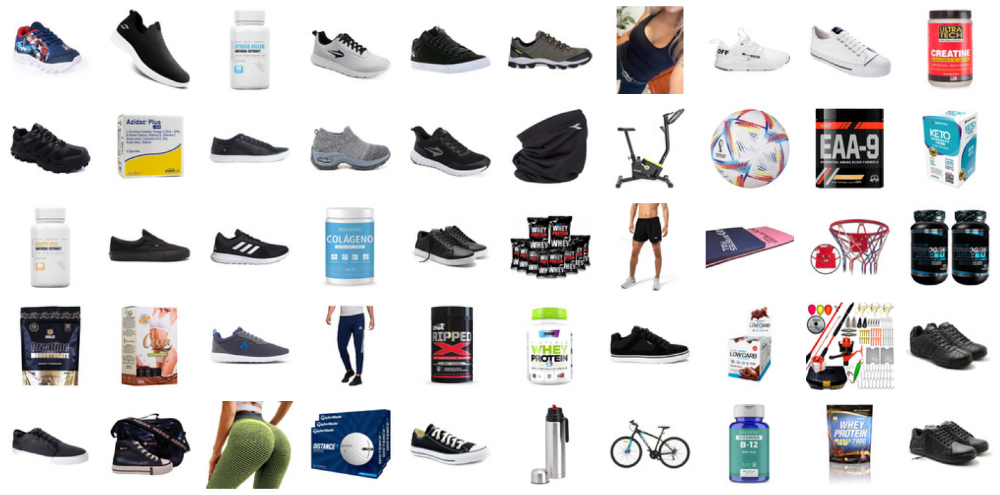

In [168]:
cwd = os.getcwd()
display_multiple_img(cwd+'/class_images__/deportes y fitness/*.jpg',5,10)

### Ropa y accesorios

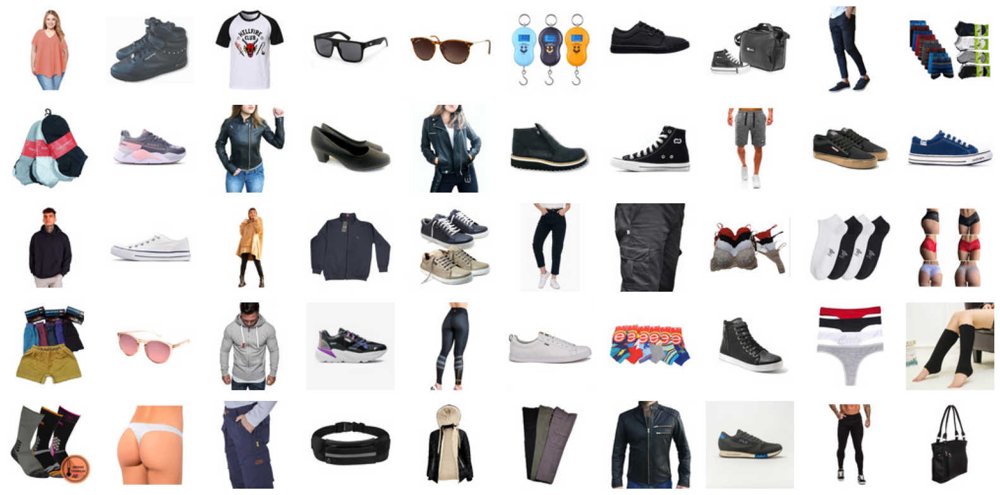

In [169]:
cwd = os.getcwd()
display_multiple_img(cwd+'/class_images__/ropa y accesorios/*.jpg',5,10)

### Servicios

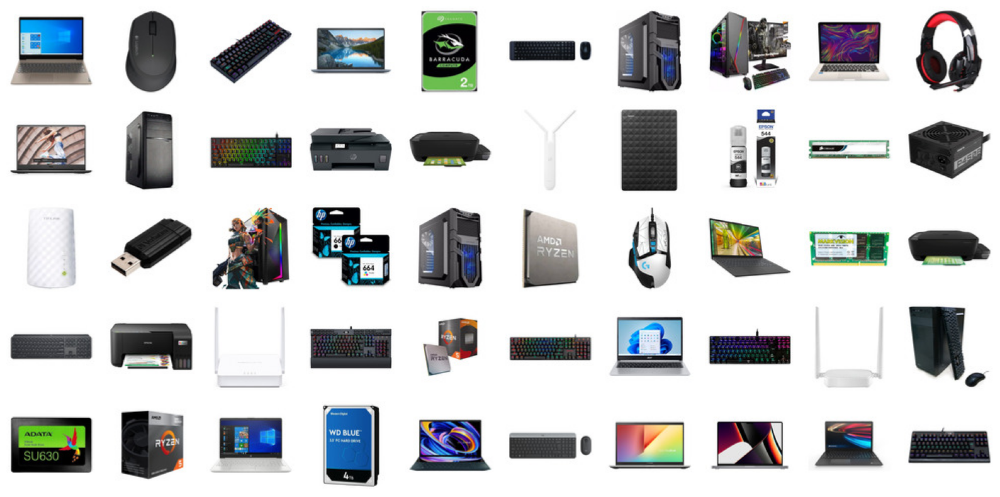

In [9]:
cwd = os.getcwd()
display_multiple_img(cwd+'/class_images__/computacion/*.jpg',5,10)

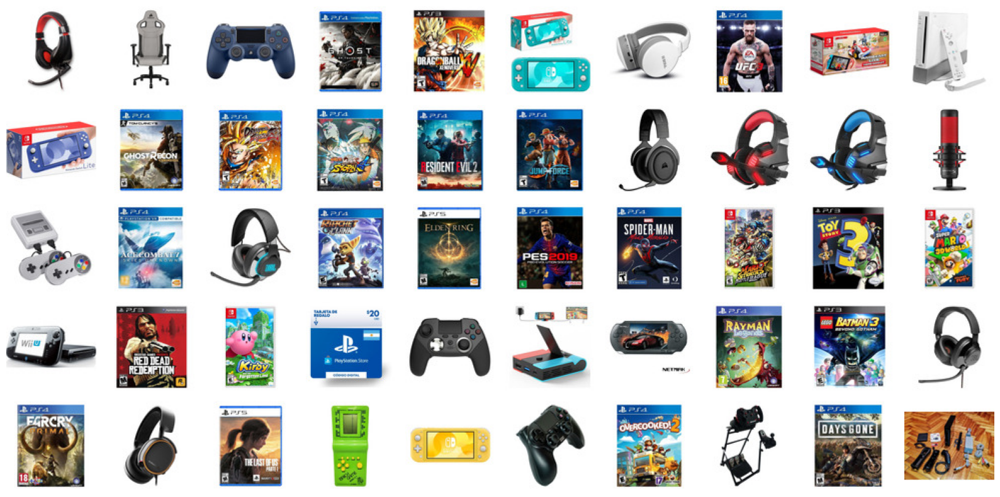

In [10]:
cwd = os.getcwd()
display_multiple_img(cwd+'/class_images__/consolas y videojuegos/*.jpg',5,10)

* A primera vista, se identifica que existen categorías que comparten productos idénticos. Algunos de los productos identificados, por ejemplo en deportes y fitness, también se encuentran en la categoría ropa y accesorios

## Entender los nombres de los productos para algunas categorías

### Deporte y fitness

/var/folders/_2/mn5plcvd0135m5y5pgyz6zpm0000gn/T/ipykernel_52188/3467461522.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




[Text(0.5, 1.0, 'Distribución de tokens por nombre de categoría: Deporte y fitness')]

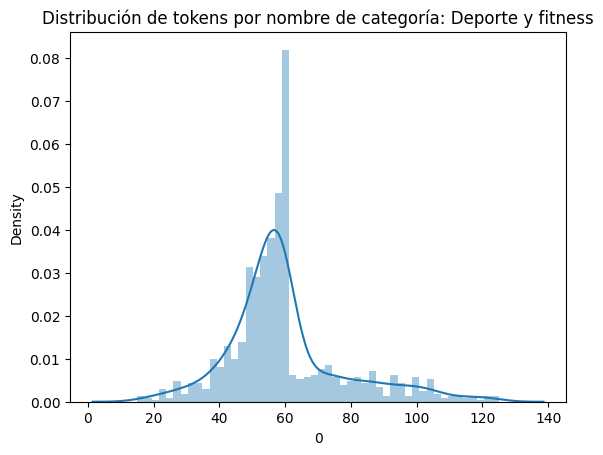

In [32]:
df_ = pd.DataFrame(df_class[df_class['categoria']=='deportes y fitness']['nombre_preproc'].unique())
ax = sns.distplot(df_[0].str.len())
ax.set(title = "Distribución de tokens por nombre de categoría: Deporte y fitness")


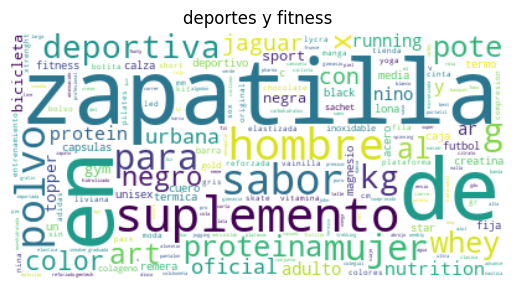

In [25]:
word_cloud_d = wordcloud_results(df_class[df_class['categoria']=='deportes y fitness']['nombre_preproc'])
plt.imshow(word_cloud_d, interpolation='bilinear')
plt.axis("off")
plt.title(str('deportes y fitness'))
plt.show()

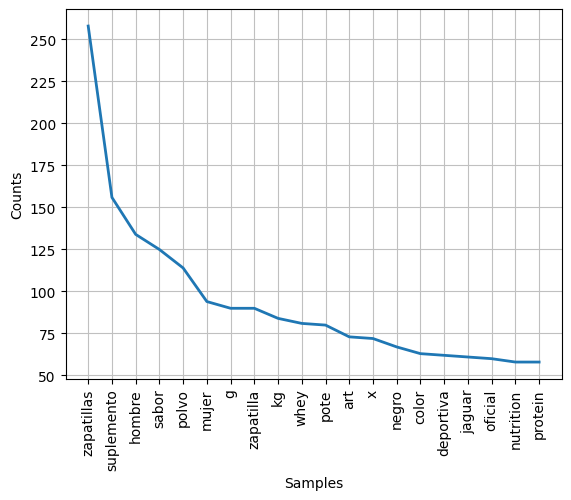

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [17]:
flat_list = [ xs for i in df_class[df_class['categoria']=='deportes y fitness']['nombre_preproc'] for xs in remove_stopwords(i)]
frequency_dist = FreqDist(flat_list)
frequency_dist.most_common(20)
frequency_dist.plot(20, cumulative=False)

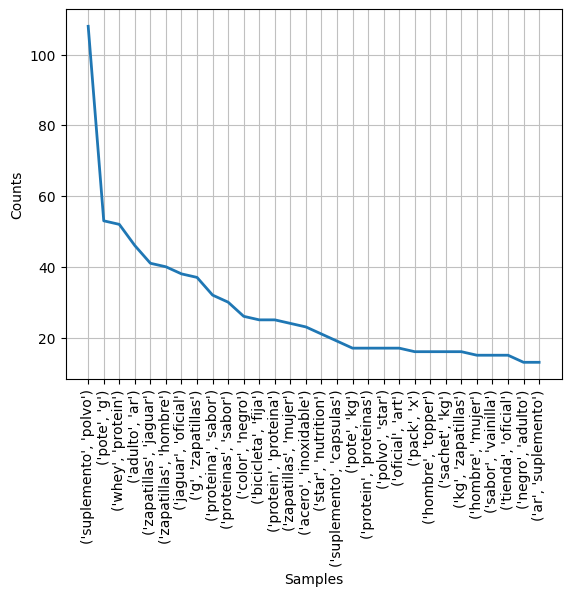

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [18]:
## Bigrams
flat_list = [ xs for i in df_class[df_class['categoria']=='deportes y fitness']['nombre_preproc'] for xs in remove_stopwords(i)]
text = " ".join(cat for cat in flat_list)
tokens = nltk.word_tokenize(text)
bgs = nltk.bigrams(tokens)
fdist = nltk.FreqDist(bgs)
fdist.plot(30)

### Ropa y accesorios

/var/folders/_2/mn5plcvd0135m5y5pgyz6zpm0000gn/T/ipykernel_52188/495607118.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




[Text(0.5, 1.0, 'Distribución de tokens por nombre de categoría: Ropa y accesorios')]

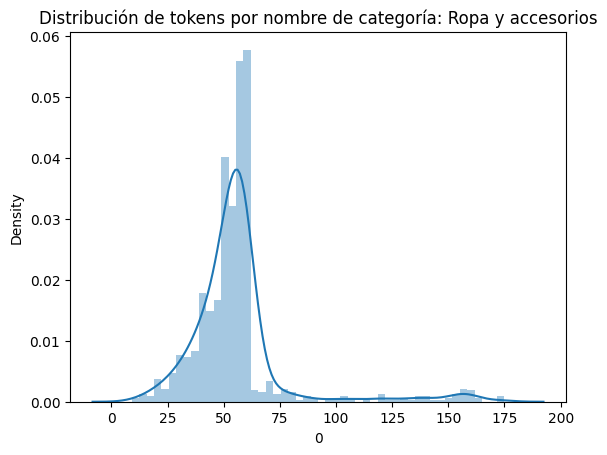

In [33]:
df_ = pd.DataFrame(df_class[df_class['categoria']=='ropa y accesorios']['nombre_preproc'].unique())
ax = sns.distplot(df_[0].str.len())
ax.set(title = "Distribución de tokens por nombre de categoría: Ropa y accesorios")

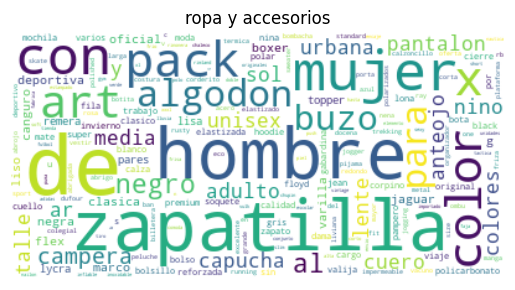

In [26]:
wordcloud_r = wordcloud_results(df_class[df_class['categoria']=='ropa y accesorios']['nombre_preproc'])
plt.imshow(wordcloud_r, interpolation='bilinear')
plt.axis("off")
plt.title(str('ropa y accesorios'))
plt.show()

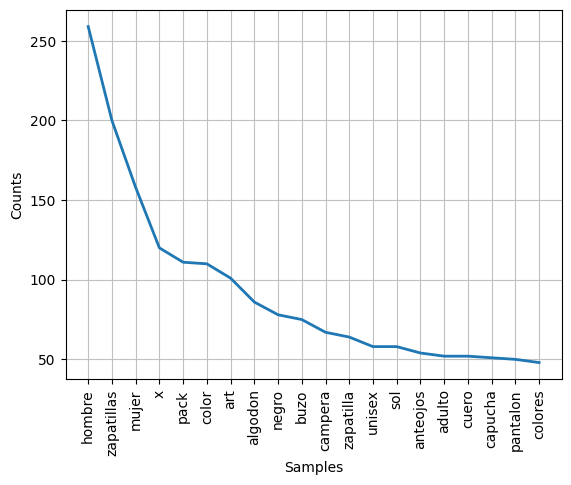

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [27]:
flat_list = [ xs for i in df_class[df_class['categoria']=='ropa y accesorios']['nombre_preproc'] for xs in remove_stopwords(i)]
frequency_dist = FreqDist(flat_list)
frequency_dist.most_common(20)
frequency_dist.plot(20, cumulative=False)

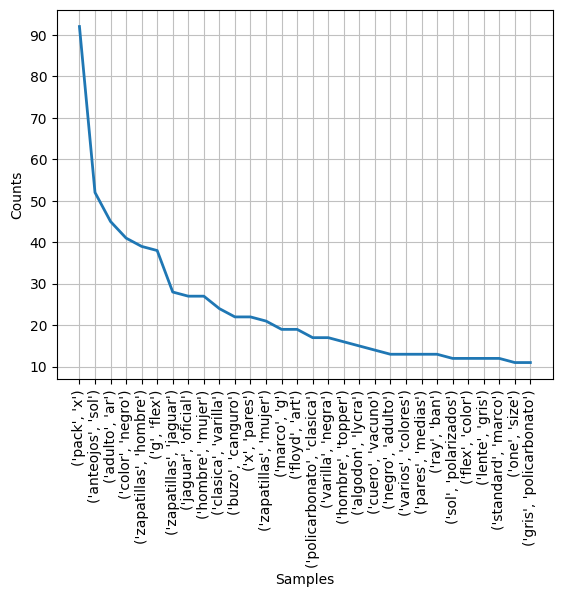

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [28]:
## Bigrams
flat_list = [ xs for i in df_class[df_class['categoria']=='ropa y accesorios']['nombre_preproc'] for xs in remove_stopwords(i)]
text = " ".join(cat for cat in flat_list)
tokens = nltk.word_tokenize(text)
bgs = nltk.bigrams(tokens)
fdist = nltk.FreqDist(bgs)
fdist.plot(30)

### Consolas y video juegos

/var/folders/_2/mn5plcvd0135m5y5pgyz6zpm0000gn/T/ipykernel_52188/2612757511.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




[Text(0.5, 1.0, 'Distribución de tokens por nombre de categoría: consolas y videojuegos')]

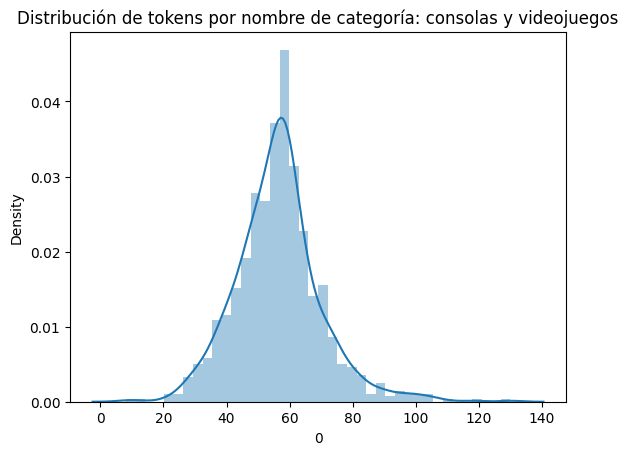

In [34]:
df_ = pd.DataFrame(df_class[df_class['categoria']=='consolas y videojuegos']['nombre_preproc'].unique())
ax = sns.distplot(df_[0].str.len())
ax.set(title = "Distribución de tokens por nombre de categoría: consolas y videojuegos")

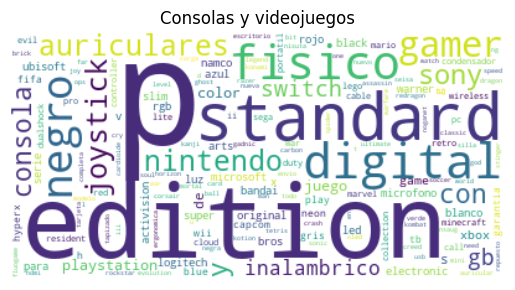

In [14]:
wordcloud_r = wordcloud_results(df_class[df_class['categoria']=='consolas y videojuegos']['nombre_preproc'])
plt.imshow(wordcloud_r, interpolation='bilinear')
plt.axis("off")
plt.title(str('Consolas y videojuegos'))
plt.show()

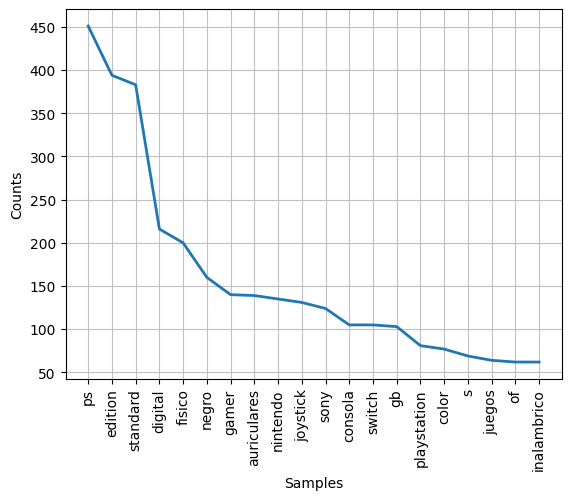

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [15]:
flat_list = [ xs for i in df_class[df_class['categoria']=='consolas y videojuegos']['nombre_preproc'] for xs in remove_stopwords(i)]
frequency_dist = FreqDist(flat_list)
frequency_dist.most_common(20)
frequency_dist.plot(20, cumulative=False)

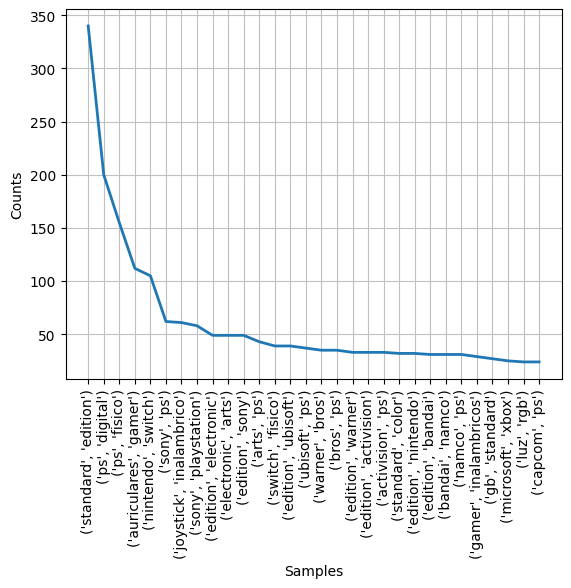

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [39]:
## Bigrams
flat_list = [ xs for i in df_class[df_class['categoria']=='consolas y videojuegos']['nombre_preproc'] for xs in remove_stopwords(i)]
text = " ".join(cat for cat in flat_list)
tokens = nltk.word_tokenize(text)
bgs = nltk.bigrams(tokens)
fdist = nltk.FreqDist(bgs)
fdist.plot(30)

### Computación

/var/folders/_2/mn5plcvd0135m5y5pgyz6zpm0000gn/T/ipykernel_52188/2078374830.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




[Text(0.5, 1.0, 'Distribución de tokens por nombre de categoría: computacion')]

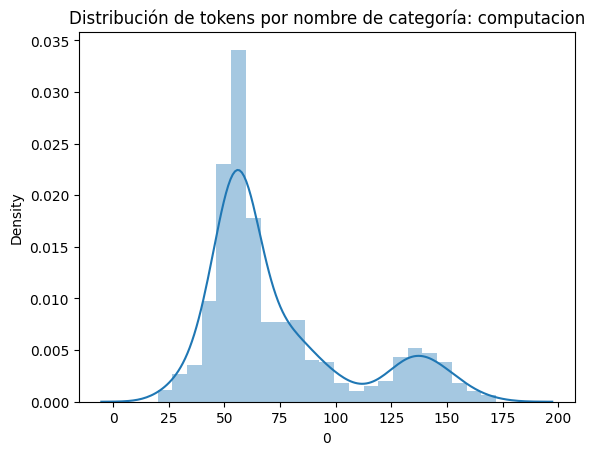

In [35]:
df_ = pd.DataFrame(df_class[df_class['categoria']=='computacion']['nombre_preproc'].unique())
ax = sns.distplot(df_[0].str.len())
ax.set(title = "Distribución de tokens por nombre de categoría: computacion")

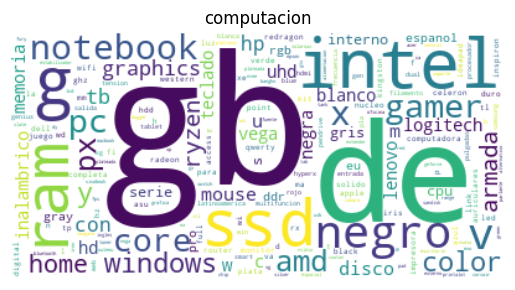

In [38]:
wordcloud_r = wordcloud_results(df_class[df_class['categoria']=='computacion']['nombre_preproc'])
plt.imshow(wordcloud_r, interpolation='bilinear')
plt.axis("off")
plt.title(str('computacion'))
plt.show()

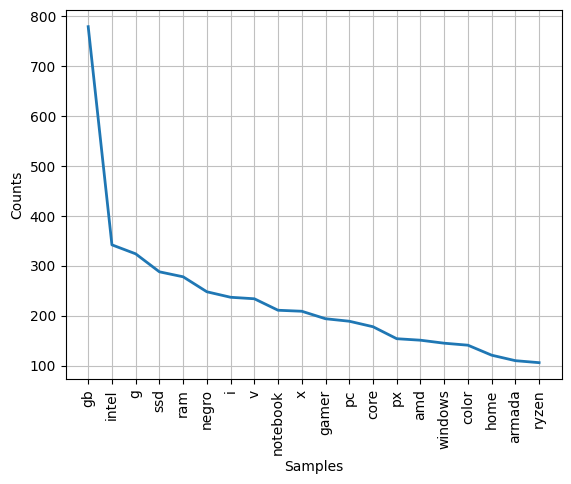

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [37]:
flat_list = [ xs for i in df_class[df_class['categoria']=='computacion']['nombre_preproc'] for xs in remove_stopwords(i)]
frequency_dist = FreqDist(flat_list)
frequency_dist.most_common(20)
frequency_dist.plot(20, cumulative=False)

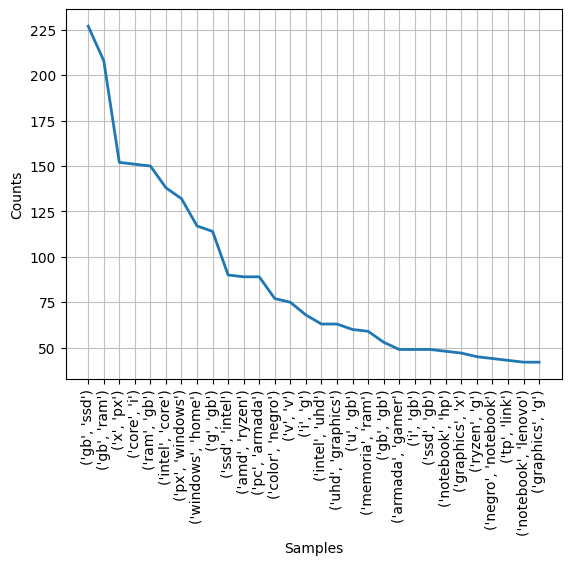

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [40]:
## Bigrams
flat_list = [ xs for i in df_class[df_class['categoria']=='computacion']['nombre_preproc'] for xs in remove_stopwords(i)]
text = " ".join(cat for cat in flat_list)
tokens = nltk.word_tokenize(text)
bgs = nltk.bigrams(tokens)
fdist = nltk.FreqDist(bgs)
fdist.plot(30)

Los top n-gramas muestran las sub-categorías más relevantes en la categoría general

## Estudiar sub-categorías

In [41]:
cwd = os.getcwd()

filepath = Path(cwd+'/dataset_sub_cats.csv')  
df_subclass = pd.read_csv(filepath,sep=',')

In [42]:
df_sub_cats = pd.DataFrame(df_subclass.groupby(['categoria','sub_categoria'])['nombre'].count()).reset_index().sort_values(by='nombre',ascending=True)

Ejemplo en el que se muestra por qué sólo la categoría no es suficiente

In [43]:
df_sub_cats[df_sub_cats['categoria']=='otras categorias']

,categoria,sub_categoria,nombre
321,otras categorias,coberturas extendidas,27
319,otras categorias,acido clorhidrico,33
327,otras categorias,licencias para taxis,43
329,otras categorias,otros,50
326,otras categorias,kits de criminalistica,50
325,otras categorias,insumos para tatuajes,50
324,otras categorias,gift cards,50
323,otras categorias,esoterismo,50
322,otras categorias,criptomonedas,50
320,otras categorias,articulos para fumadores,50


In [44]:
df_sub_cats[df_sub_cats['sub_categoria']=='otros']['categoria'].nunique()
# a la subcategoría otros están asociados 28 tipos de categorías

28

In [45]:
df_sub_cats[df_sub_cats['sub_categoria']=='ropa deportiva']

,categoria,sub_categoria,nombre
346,ropa y accesorios,ropa deportiva,50
184,deportes y fitness,ropa deportiva,50


### ¿Existe una diferencia visible entre cada subcategría?

In [46]:
def display_imgs_subclass(df_in, rows, cols):
    figure, ax = plt.subplots(nrows=rows,ncols=cols,figsize=(16,8) )
    response = [requests.get(url) for url in df_in['imagen']]
    img = [Image.open(BytesIO(res.content)) for res in response]
    for ind,image in enumerate(img):
        try:
            ax.ravel()[ind].imshow(image)
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()

#### Filtro inicial, graficar las imágenes que hagan parte de las mismas clases subclases

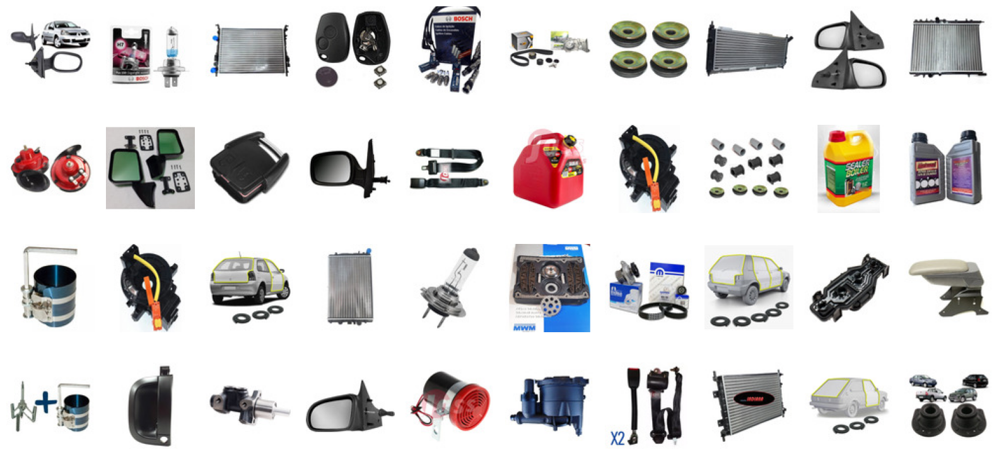

In [196]:
df_aut = df_subclass[(df_subclass['categoria']== 'accesorios para vehiculos') & (df_subclass['sub_categoria']=='repuestos autos y camionetas')]
display_imgs_subclass(df_aut,4,10)

#### Segundo filtro: productos que compartan clase, subclasee y marca

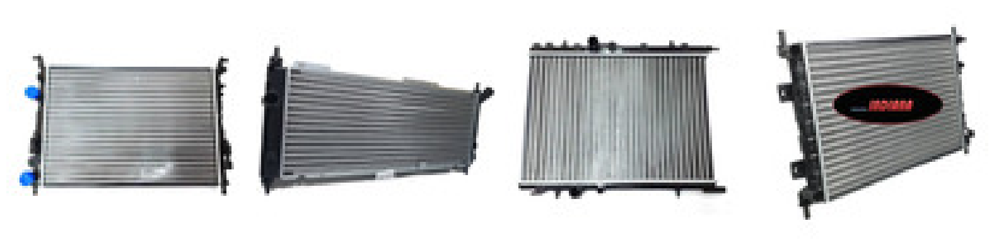

In [215]:
df_aut_2 = df_subclass[(df_subclass['categoria']== 'accesorios para vehiculos') & (df_subclass['sub_categoria']=='repuestos autos y camionetas') & (df_subclass['marca']=="['TYC']")]
display_imgs_subclass(df_aut_2,1,4)

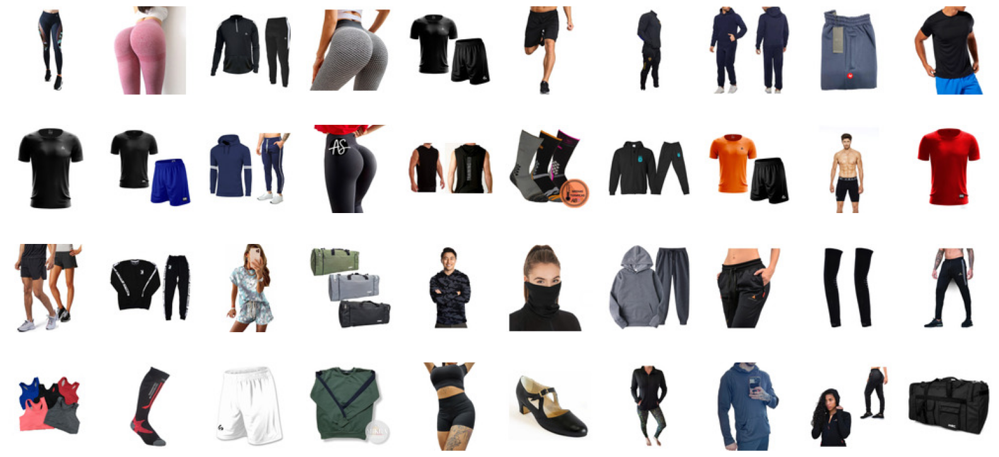

In [216]:
df_dep = df_subclass[(df_subclass['categoria']== 'deportes y fitness') & (df_subclass['sub_categoria']=='ropa deportiva')]
display_imgs_subclass(df_dep,4,10)

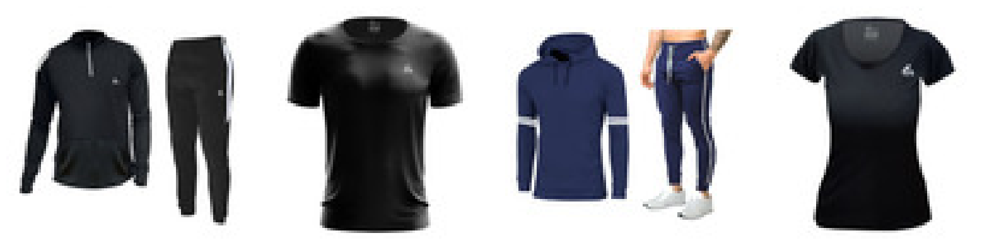

In [221]:
df_dep = df_subclass[(df_subclass['categoria']== 'deportes y fitness') & (df_subclass['sub_categoria']=='ropa deportiva')& (df_subclass['marca']=="['GDO']")]
display_imgs_subclass(df_dep,1,4)

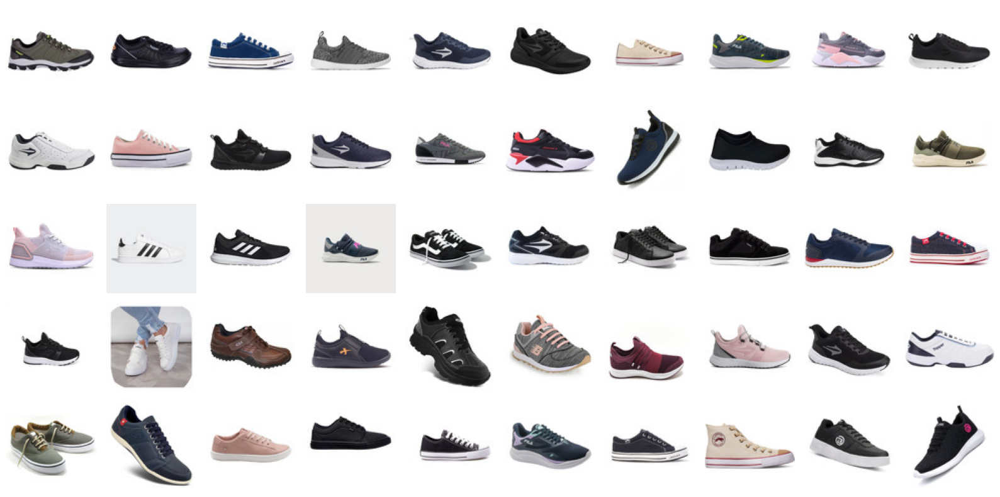

In [54]:
display_multiple_img(df_zap_dep,5,10)

* Según los ejemplos presentados, se identifica que no es suficiente con tener la categoría y subcategoría de cada producto, es necesario acudir a otras características como la marca del producto.

# Análisis de datos posterior al análisis textual 


### Número de registros por clase

In [55]:
df_ = pd.DataFrame(df_sub_cats.groupby('categoria')['sub_categoria'].count()).reset_index()
fig = px.bar(df_, x='categoria', y='sub_categoria', title='Número de subcategorías por categoría')
fig.show()

* No hay una distribución equilibrada entre el número de subcategorías pertenecientes a las categorías 

In [57]:
df_subclass.groupby('sub_categoria').count()
# se buscó tener la misma cantidad de información para cada subclase

,nombre,categoria,marca,precio,imagen,nombre_preproc,numeric_sub_cat,numeric_cat
sub_categoria,,,,,,,,
aberturas,50,50,50,50,50,50,50,50
abrigos,50,50,50,50,50,50,50,50
acc para motos y cuatriciclos,50,50,50,50,50,50,50,50
accesorios de auto y camioneta,50,50,50,50,50,50,50,50
accesorios de construccion,50,50,50,50,50,50,50,50
...,...,...,...,...,...,...,...,...
videojuegos,49,49,49,49,49,49,49,49
voley,50,50,50,50,50,50,50,50
wakeboard y esqui acuatico,50,50,50,50,50,50,50,50


## Estudiar sub-categorías

In [58]:
cwd = os.getcwd()

filepath = Path(cwd+'/dataset_sub_cats.csv')  
df_subclass = pd.read_csv(filepath,sep=',')

In [4]:
df_subclass['precio'].fillna(0, inplace=True)
df_subclass['precio'] = df_subclass['precio'].astype(int)

### Distribución de precios por categoría 

* Se comparan los casos identificados como similares en la clasificación de categorías para entender si el precio podría ser un factor diferenciador entre las clases y subclases 

/var/folders/_2/mn5plcvd0135m5y5pgyz6zpm0000gn/T/ipykernel_24670/1248223625.py:7: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/_2/mn5plcvd0135m5y5pgyz6zpm0000gn/T/ipykernel_24670/1248223625.py:11: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/var/folders/_2/mn5plcvd0135m5y5pgyz6zpm0000gn/T/ipykernel_24670/

[Text(0.5, 1.0, 'salud y equipamiento medico')]

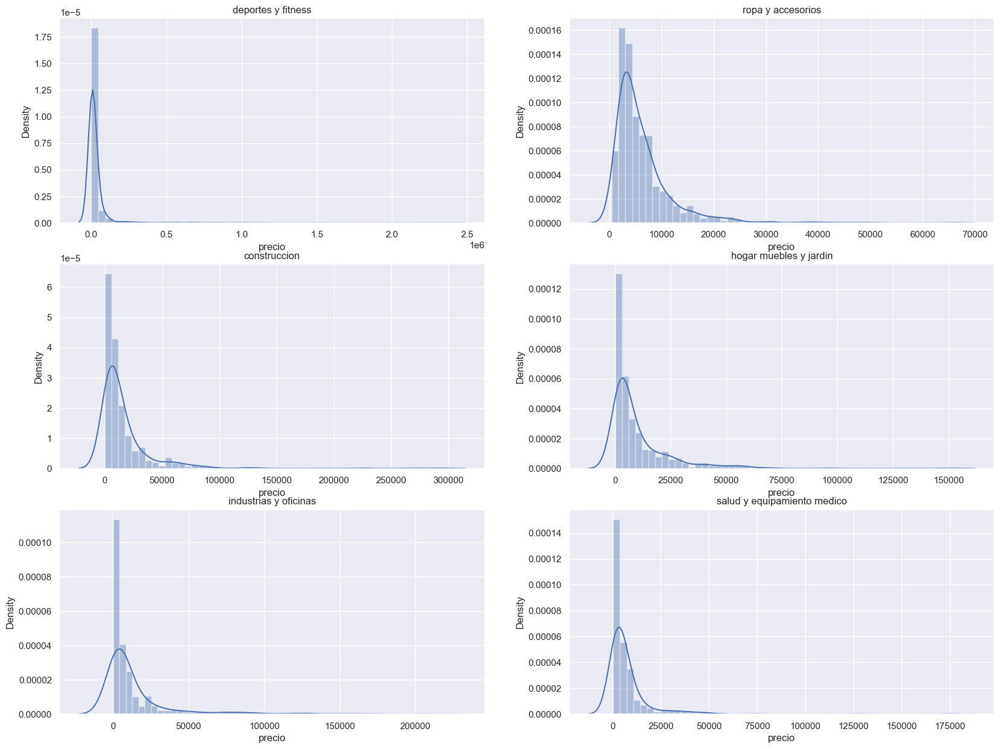

In [128]:
import numpy as np
sns.set_style('ticks')

sns.set(rc={"figure.figsize": (20, 15)}); np.random.seed(0)

plt.subplot(3,2,1)
ax = sns.distplot(df_subclass[df_subclass['categoria']=='deportes y fitness']["precio"].dropna(),kde=True)
ax.set(title = "deportes y fitness")

plt.subplot(3,2,2)
ax = sns.distplot(df_subclass[df_subclass['categoria']=='ropa y accesorios']["precio"].dropna())
ax.set(title = "ropa y accesorios")

plt.subplot(3,2,3)
ax = sns.distplot(df_subclass[df_subclass['categoria']=='construccion']["precio"].dropna())
ax.set(title = "construccion")

plt.subplot(3,2,4)
ax = sns.distplot(df_subclass[df_subclass['categoria']=='hogar  muebles y jardin']["precio"].dropna())
ax.set(title = "hogar muebles y jardin")

plt.subplot(3,2,5)
ax = sns.distplot(df_subclass[df_subclass['categoria']=='industrias y oficinas']["precio"].dropna())
ax.set(title = "industrias y oficinas")

plt.subplot(3,2,6)
ax = sns.distplot(df_subclass[df_subclass['categoria']=='salud y equipamiento medico']["precio"].dropna())
ax.set(title = "salud y equipamiento medico")



## Entender los nombres de algunas subcategorías

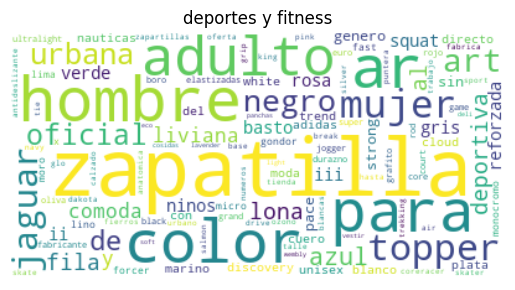

In [27]:
word_cloud_d = wordcloud_results(df_subclass[df_subclass['sub_categoria']=='zapatillas']['nombre_preproc'])
plt.imshow(word_cloud_d, interpolation='bilinear')
plt.axis("off")
plt.title(str('deportes y fitness'))
plt.show()

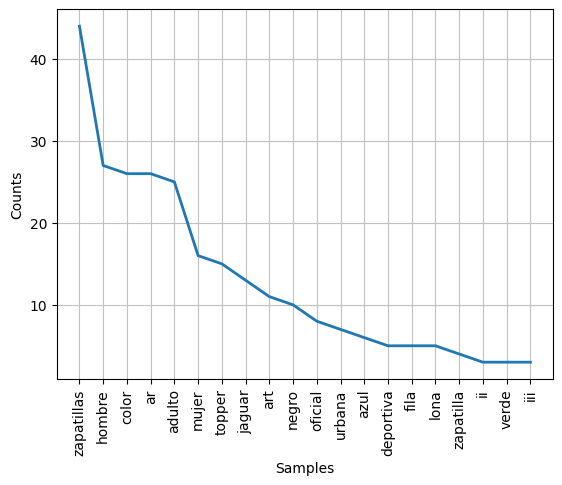

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [60]:
flat_list = [ xs for i in df_subclass[df_subclass['sub_categoria']=='zapatillas']['nombre_preproc'] for xs in remove_stopwords(i)]
frequency_dist = FreqDist(flat_list)
frequency_dist.most_common(20)
frequency_dist.plot(20, cumulative=False)

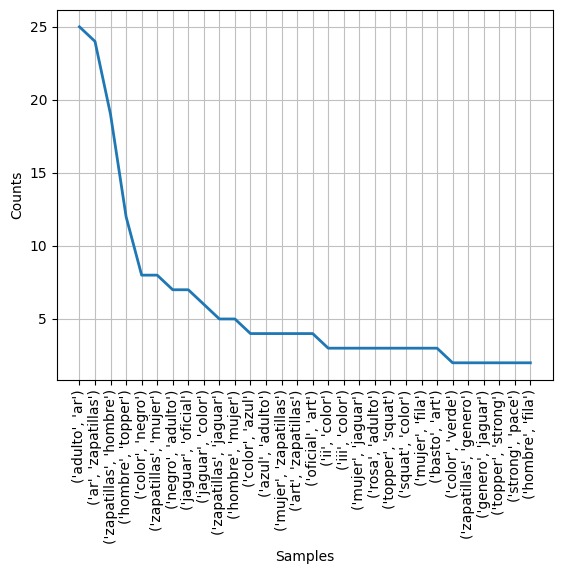

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [61]:
## Bigrams
flat_list = [ xs for i in df_subclass[df_subclass['sub_categoria']=='zapatillas']['nombre_preproc'] for xs in remove_stopwords(i)]
text = " ".join(cat for cat in flat_list)
tokens = nltk.word_tokenize(text)
bgs = nltk.bigrams(tokens)
fdist = nltk.FreqDist(bgs)
fdist.plot(30)

# Conclusión